In [2]:
import sys
import numpy
import matplotlib
import pandas
import sklearn

print('{}'.format(sys.version))
print('{}'.format(numpy.__version__))
print('{}'.format(matplotlib.__version__))
print('{}'.format(pandas.__version__))
print('{}'.format(sklearn.__version__))

3.7.4 (default, Aug 13 2019, 20:35:49) 
[GCC 7.3.0]
1.17.2
3.1.1
0.25.1
0.21.3


In [3]:
import numpy as np 
from sklearn import preprocessing,model_selection
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.svm import SVC
from sklearn.metrics import classification_report,accuracy_score
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import pandas as pd

In [4]:
#Loading the dataset

url = "https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/breast-cancer-wisconsin.data"
names = ['id','clump_thicknes','uniform_cell_size','uniform_cell_shape','marginal_adhesion','single_epithelial_size','bare_nuclei','bland_chromatin','normal_nucleoli','mitoses','class']
df = pd.read_csv(url,names=names)

In [5]:
df.replace('?',-99999,inplace=True)
print(df.axes)

[RangeIndex(start=0, stop=699, step=1), Index(['id', 'clump_thicknes', 'uniform_cell_size', 'uniform_cell_shape',
       'marginal_adhesion', 'single_epithelial_size', 'bare_nuclei',
       'bland_chromatin', 'normal_nucleoli', 'mitoses', 'class'],
      dtype='object')]


In [25]:
print(df.describe)

<bound method NDFrame.describe of           id  clump_thicknes  uniform_cell_size  uniform_cell_shape  \
0    1000025               5                  1                   1   
1    1002945               5                  4                   4   
2    1015425               3                  1                   1   
3    1016277               6                  8                   8   
4    1017023               4                  1                   1   
..       ...             ...                ...                 ...   
694   776715               3                  1                   1   
695   841769               2                  1                   1   
696   888820               5                 10                  10   
697   897471               4                  8                   6   
698   897471               4                  8                   8   

     marginal_adhesion  single_epithelial_size bare_nuclei  bland_chromatin  \
0                    1            

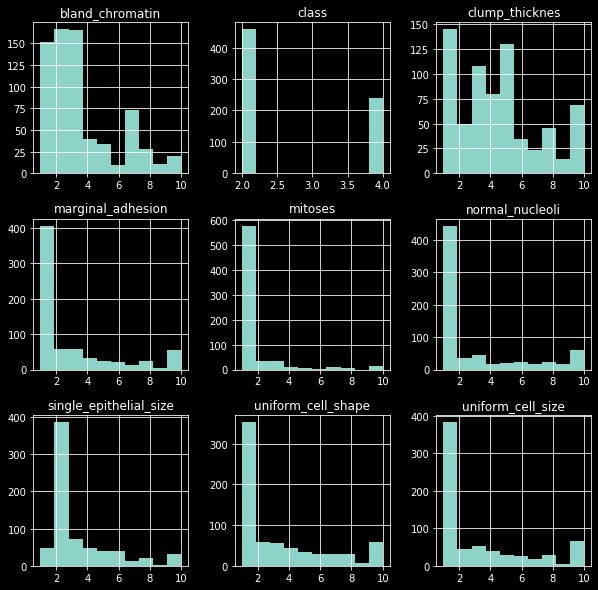

,clump_thicknes,uniform_cell_size,uniform_cell_shape,marginal_adhesion,single_epithelial_size,bare_nuclei,bland_chromatin,normal_nucleoli,mitoses,class
0,5,1,1,1,2,1,3,1,1,2
1,5,4,4,5,7,10,3,2,1,2
2,3,1,1,1,2,2,3,1,1,2
3,6,8,8,1,3,4,3,7,1,2
4,4,1,1,3,2,1,3,1,1,2
...,...,...,...,...,...,...,...,...,...,...
694,3,1,1,1,3,2,1,1,1,2
695,2,1,1,1,2,1,1,1,1,2
696,5,10,10,3,7,3,8,10,2,4
697,4,8,6,4,3,4,10,6,1,4


In [24]:
# Plotting Histogran for given data

df.hist(figsize=(10,10))
plt.show()
df

In [6]:
# Creating training and testing datasets

x = np.array(df.drop(columns='class'))
y= np.array(df['class'])
x_train,x_test,y_train,y_test = model_selection.train_test_split(x,y,test_size=0.2)
print(x_train,'\n',y_train)

[[1206841 10 5 ... 7 7 10]
 [832567 4 2 ... 7 6 1]
 [1268313 5 1 ... 1 1 1]
 ...
 [1321348 2 1 ... 2 1 1]
 [1116998 10 4 ... 4 3 10]
 [466906 1 1 ... 1 1 1]] 
 [4 4 2 4 2 2 4 2 4 4 4 2 2 2 2 4 2 2 2 4 2 4 2 2 4 2 2 2 2 2 4 2 2 2 2 2 4
 4 2 4 2 2 2 2 4 4 2 2 2 2 4 4 4 4 2 2 4 4 2 4 2 4 2 4 2 4 4 2 2 2 4 2 4 4
 4 4 2 4 2 4 4 2 2 2 2 2 2 2 4 2 4 4 4 2 2 2 4 4 4 4 2 2 4 2 2 2 2 4 4 2 2
 2 4 2 2 2 4 2 2 2 4 2 2 2 4 4 2 2 4 2 2 4 2 2 2 2 2 2 2 4 2 2 4 2 2 2 4 2
 2 4 2 2 4 2 2 4 2 4 2 4 4 2 2 2 2 4 4 2 2 2 4 2 2 2 4 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 4 2 4 4 4 2 2 2 2 4 2 4 2 2 2 2 2 2 2 2 2 2 2 2 4 2 4 2 4 2
 2 2 2 2 2 4 2 4 2 4 4 2 2 4 2 2 4 4 2 2 2 2 2 4 2 2 4 2 2 2 2 2 2 2 2 2 4
 4 4 2 2 4 2 2 2 2 2 4 4 2 2 4 2 2 2 2 4 2 2 4 2 2 2 4 2 4 4 4 2 2 2 2 2 2
 2 2 2 2 4 2 4 2 2 2 4 2 2 2 2 2 4 4 4 2 4 2 2 2 2 2 2 2 2 4 2 2 2 2 2 2 4
 4 4 2 4 2 2 2 4 4 4 2 2 2 2 4 4 2 4 2 2 4 2 2 2 2 2 2 2 2 2 2 2 4 2 2 4 2
 4 4 2 2 2 2 4 2 2 4 2 2 2 4 2 2 2 2 2 4 4 2 2 2 4 2 2 2 2 4 2 2 2 4 2 4 4
 4 2 4 4 2 2 4 

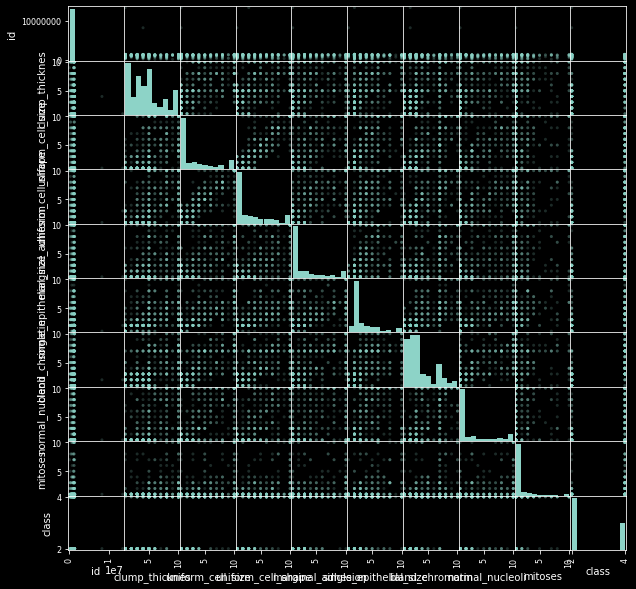

In [28]:
# Analysing feature by scattering 

scatter_matrix(df,alpha=0.2,figsize=(10,10))
plt.show()

In [10]:
# Define models to train

models = []
models.append(('KNN',KNeighborsClassifier(n_neighbors=5)))
models.append(('SVM',SVC()))

# Evaluate each model in turn

results = []
names = []

for name,model in models:
    kfold = model_selection.KFold(n_splits=10,random_state=8)
    cv_results = model_selection.cross_val_score(model,x_train,y_train,cv=kfold,scoring= 'accuracy')
    results.append(cv_results)
    names.append(name)
    msg = "%s : %f (%f)"%(name,cv_results.mean(),cv_results.std())
    print(msg)


KNN : 0.631299 (0.069093)
SVM : 0.654610 (0.073919)
/home/sathyanarayanan/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/home/sathyanarayanan/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/home/sathyanarayanan/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this wa

In [46]:
# Define models to test

models = []
models.append(('KNN',KNeighborsClassifier(n_neighbors=5)))
models.append(('SVM',SVC()))

# Evaluate each model in turn

results = []
names = []

for name,model in models:
    model.fit(x_train,y_train)
    y_pred = model.predict(x_test)
    print(accuracy_score(y_test,y_pred))
    print(classification_report(y_test,y_pred))

0.65
              precision    recall  f1-score   support

           2       0.68      0.88      0.76        90
           4       0.52      0.24      0.33        50

    accuracy                           0.65       140
   macro avg       0.60      0.56      0.55       140
weighted avg       0.62      0.65      0.61       140

0.65
              precision    recall  f1-score   support

           2       0.65      1.00      0.79        90
           4       1.00      0.02      0.04        50

    accuracy                           0.65       140
   macro avg       0.82      0.51      0.41       140
weighted avg       0.77      0.65      0.52       140

/home/sathyanarayanan/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


In [55]:
# Predicting a random example
svm = SVC()
svm.fit(x_train,y_train)
acc = svm.score(x_test,y_test)
print(acc)
val = np.array([[4,5,2,7,8,1,0,4,3,5]])
val = val.reshape(len(val),-1)
print(svm.predict(val))

0.65
[2]
/home/sathyanarayanan/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
